# Importing Required Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# To display all columns
pd.set_option('display.max_columns', None)

In [ ]:
#Reading the files with the path
users=pd.read_csv("/content/Users.csv",delimiter=',',encoding='latin-1',on_bad_lines='warn')
books=pd.read_csv("/content/Books.csv",delimiter=',',encoding='latin-1',on_bad_lines='warn')
ratings=pd.read_csv("/content/Ratings.csv",delimiter=',',encoding='latin-1',on_bad_lines='warn')

In [ ]:
print("Users Dataset: ")
users.head()

Users Dataset: 


,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [ ]:
print("\nBooks Dataset: ")
books.head()


Books Dataset: 


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [ ]:
print("\nRatings Dataset: ")
ratings.head()


Ratings Dataset: 


,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
# Checking the shapes
print("\nShapes of the datasets:")
print(f"Users: {users.shape}, Books: {books.shape}, Ratings: {ratings.shape}")


Shapes of the datasets:
Users: (278858, 3), Books: (271360, 8), Ratings: (1149780, 3)


In [ ]:
### Renaming columns for consistency
users.columns = ['User-ID', 'Location', 'Age']
books.columns = ['ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher',
                 'Image-URL-S', 'Image-URL-M', 'Image-URL-L']
ratings.columns = ['User-ID', 'ISBN', 'Book-Rating']

In [ ]:
##Merging Datasets of ratings and books
ratings_books = pd.merge(ratings, books, on='ISBN', how='left')

In [ ]:
ratings_books

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
1,276726,0155061224,5,Rites of Passage,Judith Rae,2001,Heinle,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...
2,276727,0446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
3,276729,052165615X,3,Help!: Level 1,Philip Prowse,1999,Cambridge University Press,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...
4,276729,0521795028,6,The Amsterdam Connection : Level 4 (Cambridge ...,Sue Leather,2001,Cambridge University Press,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...
...,...,...,...,...,...,...,...,...,...,...
1149775,276704,1563526298,9,Get Clark Smart : The Ultimate Guide for the S...,Clark Howard,2000,Longstreet Press,http://images.amazon.com/images/P/1563526298.0...,http://images.amazon.com/images/P/1563526298.0...,http://images.amazon.com/images/P/1563526298.0...
1149776,276706,0679447156,0,Eight Weeks to Optimum Health: A Proven Progra...,Andrew Weil,1997,Alfred A. Knopf,http://images.amazon.com/images/P/0679447156.0...,http://images.amazon.com/images/P/0679447156.0...,http://images.amazon.com/images/P/0679447156.0...
1149777,276709,0515107662,10,The Sherbrooke Bride (Bride Trilogy (Paperback)),Catherine Coulter,1996,Jove Books,http://images.amazon.com/images/P/0515107662.0...,http://images.amazon.com/images/P/0515107662.0...,http://images.amazon.com/images/P/0515107662.0...
1149778,276721,0590442449,10,Fourth Grade Rats,Jerry Spinelli,1996,Scholastic,http://images.amazon.com/images/P/0590442449.0...,http://images.amazon.com/images/P/0590442449.0...,http://images.amazon.com/images/P/0590442449.0...


In [ ]:
# Merging all datasets and storing in the variable data
data = pd.merge(ratings_books, users, on='User-ID', how='left')

In [ ]:
print("\nCombined dataset sample:")
data.head()



Combined dataset sample:


,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,Location,Age
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,"tyler, texas, usa",NaN
1,276726,0155061224,5,Rites of Passage,Judith Rae,2001,Heinle,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...,"seattle, washington, usa",NaN
2,276727,0446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,"h, new south wales, australia",16.0
3,276729,052165615X,3,Help!: Level 1,Philip Prowse,1999,Cambridge University Press,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...,"rijeka, n/a, croatia",16.0
4,276729,0521795028,6,The Amsterdam Connection : Level 4 (Cambridge ...,Sue Leather,2001,Cambridge University Press,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...,"rijeka, n/a, croatia",16.0


In [ ]:
print("\nComplete information of the Dataset: ")
data.info()


Complete information of the Dataset: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 12 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   User-ID              1149780 non-null  int64  
 1   ISBN                 1149780 non-null  object 
 2   Book-Rating          1149780 non-null  int64  
 3   Book-Title           1031136 non-null  object 
 4   Book-Author          1031134 non-null  object 
 5   Year-Of-Publication  1031136 non-null  object 
 6   Publisher            1031134 non-null  object 
 7   Image-URL-S          1031136 non-null  object 
 8   Image-URL-M          1031136 non-null  object 
 9   Image-URL-L          1031132 non-null  object 
 10  Location             1149780 non-null  object 
 11  Age                  840288 non-null   float64
dtypes: float64(1), int64(2), object(9)
memory usage: 105.3+ MB


## Checking for Null Values

In [ ]:
data.isnull().sum()

,0
User-ID,0
ISBN,0
Book-Rating,0
Book-Title,118644
Book-Author,118646
Year-Of-Publication,118644
Publisher,118646
Image-URL-S,118644
Image-URL-M,118644
Image-URL-L,118648


In [ ]:
data["Age"].describe()

,Age
count,840288.000000
mean,37.239724
std,14.246676
min,0.000000
25%,28.000000
50%,35.000000
75%,45.000000
max,244.000000


In [ ]:
data["Age"].fillna(data["Age"].median(), inplace=True)

In [ ]:
data.dropna(inplace=True)

In [ ]:
data[data.duplicated(keep="first")]

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,Location,Age


In [ ]:
data.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,Location,Age
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,"tyler, texas, usa",35.0
1,276726,0155061224,5,Rites of Passage,Judith Rae,2001,Heinle,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...,http://images.amazon.com/images/P/0155061224.0...,"seattle, washington, usa",35.0
2,276727,0446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,"h, new south wales, australia",16.0
3,276729,052165615X,3,Help!: Level 1,Philip Prowse,1999,Cambridge University Press,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...,http://images.amazon.com/images/P/052165615X.0...,"rijeka, n/a, croatia",16.0
4,276729,0521795028,6,The Amsterdam Connection : Level 4 (Cambridge ...,Sue Leather,2001,Cambridge University Press,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...,http://images.amazon.com/images/P/0521795028.0...,"rijeka, n/a, croatia",16.0


In [ ]:
data["Location"].nunique()

22480

In [ ]:
data['ISBN'].nunique()

270144

In [ ]:
data['Publisher'].nunique()

16725

In [ ]:
data['Book-Author'].nunique()

101584

In [ ]:
data["Year-Of-Publication"].value_counts()

,count
Year-Of-Publication,
2002,87275
2001,75308
1999,70207
2003,69219
2000,67578
...,...
1378,1
2024,1
1900,1


In [ ]:
data.drop(["Image-URL-S","Image-URL-M","Image-URL-S","Image-URL-L","Location","ISBN","Publisher","Book-Author",],axis=1,inplace=True)

In [ ]:
data.reset_index(inplace=True)

In [ ]:
data.drop(["index"],axis=1,inplace=True)

In [ ]:
data.head()

,User-ID,Book-Rating,Book-Title,Year-Of-Publication,Age
0,276725,0,Flesh Tones: A Novel,2002,35.0
1,276726,5,Rites of Passage,2001,35.0
2,276727,0,The Notebook,1996,16.0
3,276729,3,Help!: Level 1,1999,16.0
4,276729,6,The Amsterdam Connection : Level 4 (Cambridge ...,2001,16.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1031128 entries, 0 to 1031127
Data columns (total 5 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   User-ID              1031128 non-null  int64  
 1   Book-Rating          1031128 non-null  int64  
 2   Book-Title           1031128 non-null  object 
 3   Year-Of-Publication  1031128 non-null  object 
 4   Age                  1031128 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 39.3+ MB


## Checking and dropping Duplicates

In [ ]:
data[data.duplicated(keep="first")]

,User-ID,Book-Rating,Book-Title,Year-Of-Publication,Age
1338,277427,0,Lightning,1996,48.0
1913,277523,10,The King of Torts,2003,62.0
5462,278418,0,The Bears' Christmas (Beginner Books),2002,35.0
5726,278418,0,A Painted House,2001,35.0
6877,278418,0,Primary Colors: A Novel of Politics,1996,35.0
...,...,...,...,...,...
1015063,271284,0,Dynasty of Desire,1984,50.0
1016635,271705,0,The Hunchback of Notre Dame,1996,25.0
1023205,274301,0,Possession,1988,41.0
1023984,274308,0,The King of Torts,2003,33.0


In [ ]:
data.drop_duplicates(keep="first",inplace=True)

In [ ]:
data.reset_index(drop=True,inplace=True)

In [ ]:
data[data.duplicated(keep="first")]

,User-ID,Book-Rating,Book-Title,Year-Of-Publication,Age


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030751 entries, 0 to 1030750
Data columns (total 5 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   User-ID              1030751 non-null  int64  
 1   Book-Rating          1030751 non-null  int64  
 2   Book-Title           1030751 non-null  object 
 3   Year-Of-Publication  1030751 non-null  object 
 4   Age                  1030751 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 39.3+ MB


In [ ]:
data['Year-Of-Publication'] = pd.to_numeric(data['Year-Of-Publication'], errors='coerce')

In [ ]:
data.isnull().sum()

,0
User-ID,0
Book-Rating,0
Book-Title,0
Year-Of-Publication,0
Age,0


## Detecting Anamolies and Treating with Percentile method

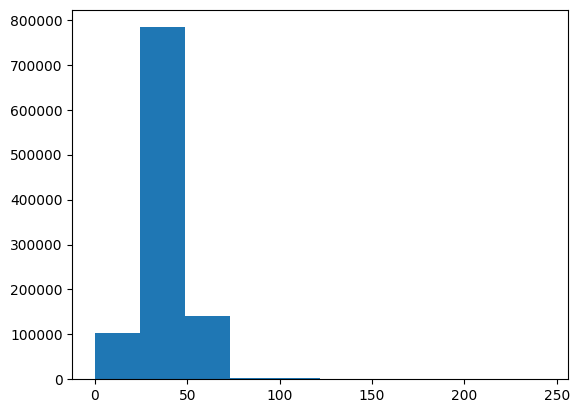

In [ ]:
plt.hist(data["Age"])
plt.show()

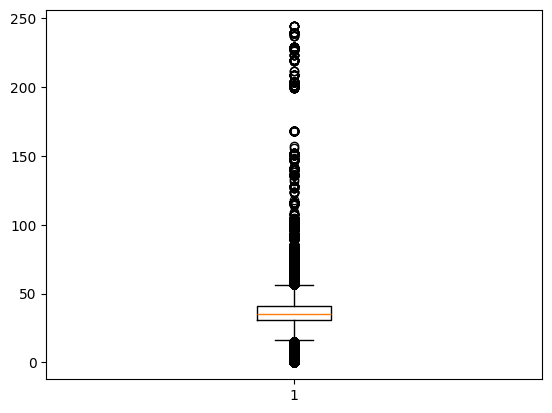

In [ ]:
plt.boxplot(data["Age"])
plt.show()

In [ ]:
a=np.percentile(data.Age,[99])[0]
a

67.0

In [ ]:
data.Age[(data.Age>2*a)]=2*a

In [ ]:
b=np.percentile(data.Age,[1])[0]
b

14.0

In [ ]:
data.Age[(data.Age<2*b)]=2*b

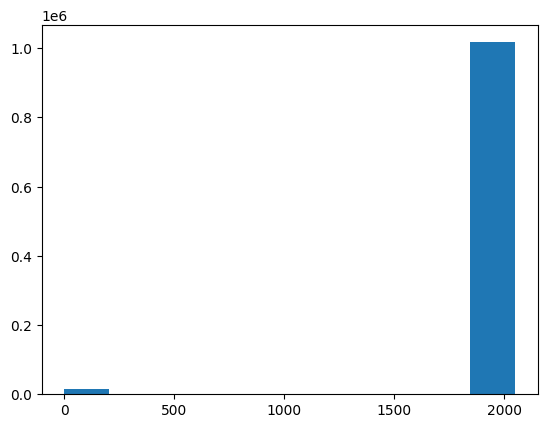

In [ ]:
plt.hist(data["Year-Of-Publication"])
plt.show()

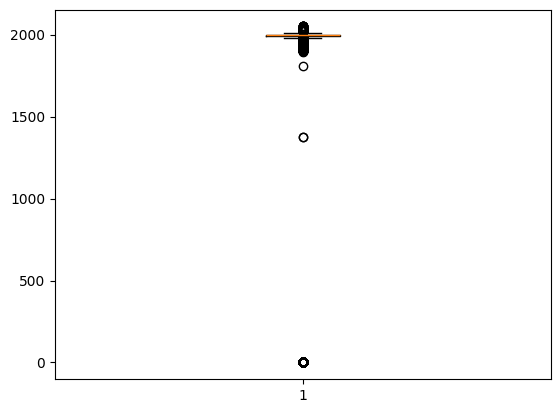

In [ ]:
plt.boxplot(data["Year-Of-Publication"])
plt.show()

In [ ]:
data["Year-Of-Publication"].describe()

,Year-Of-Publication
count,1.030751e+06
mean,1.968198e+03
std,2.310866e+02
min,0.000000e+00
25%,1.992000e+03
50%,1.997000e+03
75%,2.001000e+03
max,2.050000e+03


In [ ]:
data["Year-Of-Publication"][(data["Year-Of-Publication"]<1800)]=1800

# Visualizations

### Piechart

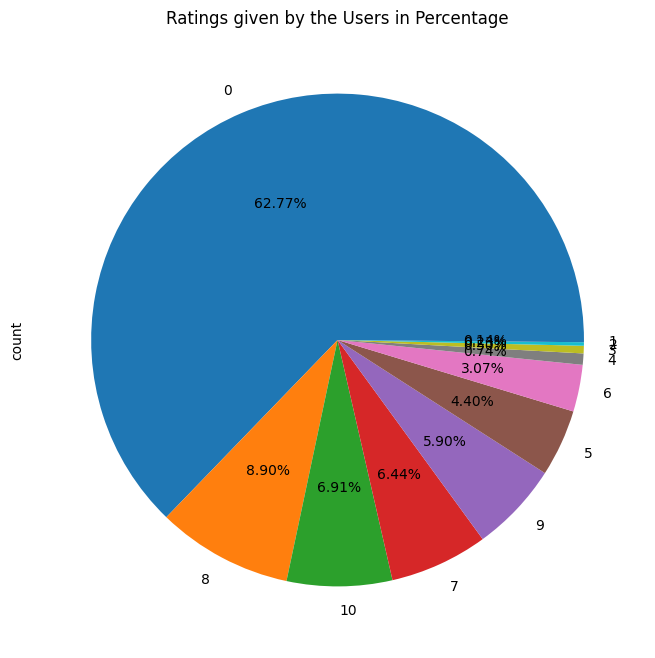

In [ ]:
plt.figure(figsize=(10,8))
plt.title('Ratings given by the Users in Percentage')
data["Book-Rating"].value_counts().plot(kind="pie",autopct="%1.2f%%")
plt.show()

### Barplot

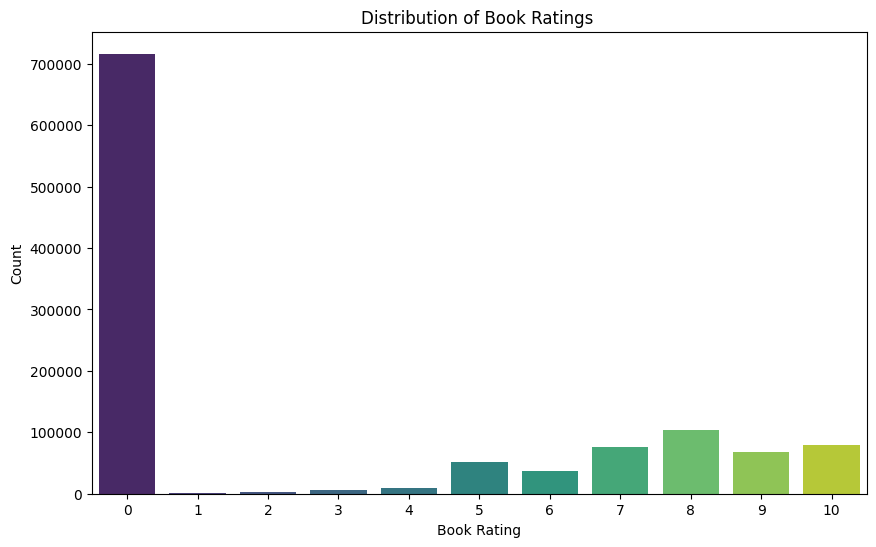

In [ ]:
# Plot the distribution of Book Ratings
plt.figure(figsize=(10, 6))
sns.countplot(x='Book-Rating', data=ratings, palette='viridis')
plt.title("Distribution of Book Ratings ")
plt.xlabel("Book Rating")
plt.ylabel("Count")
plt.show()

In [ ]:
### Top Rated Books
# Filter out ratings > 0 (explicit ratings)
explicit_ratings = ratings_books[ratings_books['Book-Rating'] > 0]

In [ ]:
# Group by Book Title and calculate mean and count of ratings
top_books = explicit_ratings.groupby('Book-Title')['Book-Rating'].agg(['mean', 'count']).reset_index()
top_books = top_books.sort_values(by='count', ascending=False)

In [ ]:
# Display top 10 books
print("\nTop 10 most rated books:")
top_books.head(10)


Top 10 most rated books:


,Book-Title,mean,count
110229,The Lovely Bones: A Novel,8.185290,707
132241,Wild Animus,4.390706,581
102703,The Da Vinci Code,8.439271,494
116196,The Secret Life of Bees,8.477833,406
111950,The Nanny Diaries: A Novel,7.437659,393
114960,The Red Tent (Bestselling Backlist),8.182768,383
15761,Bridget Jones's Diary,7.625995,377
3064,A Painted House,7.398907,366
60688,Life of Pi,8.080357,336
45374,Harry Potter and the Chamber of Secrets (Book 2),8.840491,326


### Barplot

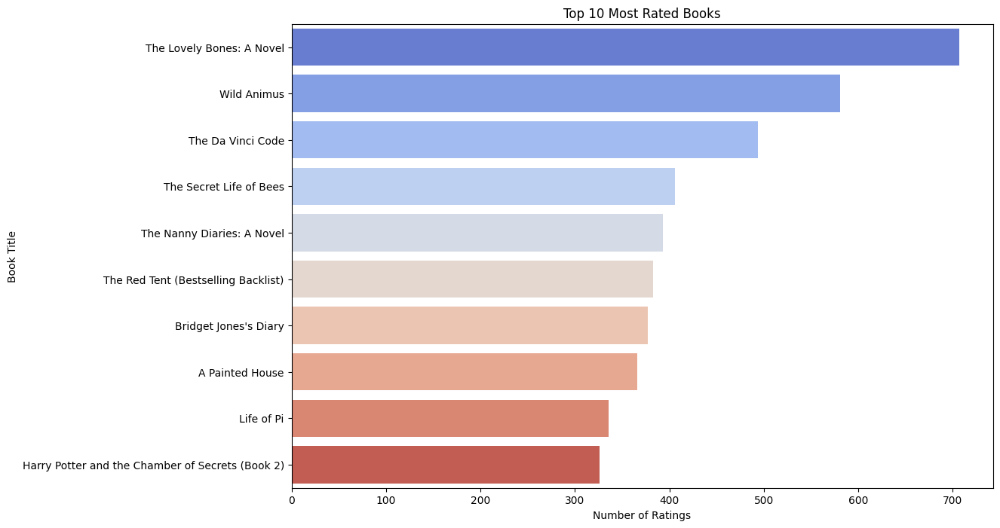

In [ ]:
### Step 7: Most Popular Books Visualization
plt.figure(figsize=(12, 8))
sns.barplot(x='count', y='Book-Title', data=top_books.head(10), palette='coolwarm')
plt.title("Top 10 Most Rated Books")
plt.xlabel("Number of Ratings")
plt.ylabel("Book Title")
plt.show()

### Density plot

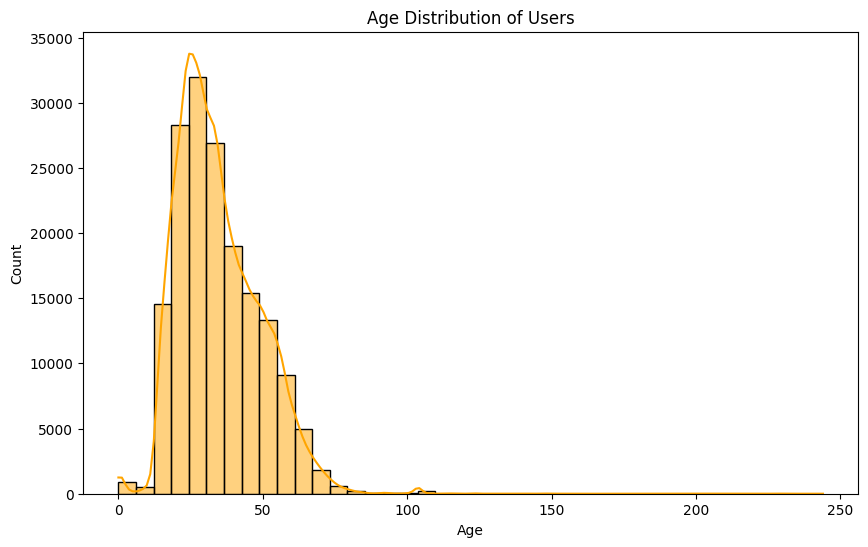

In [ ]:
### User Age Analysis
plt.figure(figsize=(10, 6))
sns.histplot(users['Age'], bins=40, kde=True, color='orange')
plt.title("Age Distribution of Users")
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

In [ ]:
###  Most Active Users
# Find the most active users based on the number of ratings they provided
most_active_users = ratings.groupby('User-ID').count()['Book-Rating'].sort_values(ascending=False).head(10)
print("\nTop 10 most active users:")
most_active_users


Top 10 most active users:


,Book-Rating
User-ID,
11676,13602
198711,7550
153662,6109
98391,5891
35859,5850
212898,4785
278418,4533
76352,3367
110973,3100


### Barplot

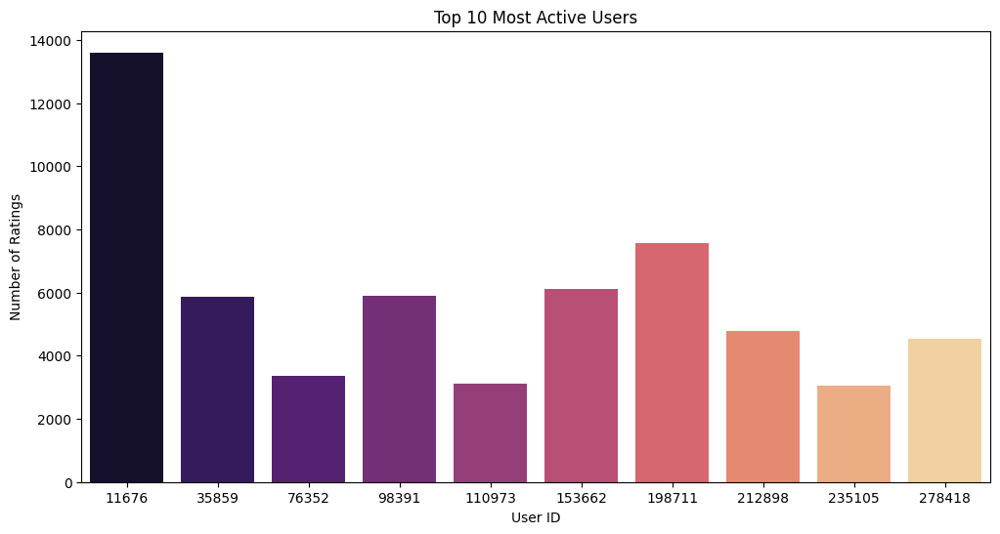

In [ ]:

plt.figure(figsize=(12, 6))
sns.barplot(x=most_active_users.index, y=most_active_users.values, palette='magma')
plt.title("Top 10 Most Active Users")
plt.xlabel("User ID")
plt.ylabel("Number of Ratings")
plt.show()

In [ ]:
data['Year-Of-Publication'].value_counts()

,count
Year-Of-Publication,
2002,91766
2001,79771
1999,75152
2003,72471
2000,72302
...,...
2008,1
2012,1
1904,1


In [ ]:
### Yearly Book Publication Trend
# Group by year and count books published
books_per_year = data['Year-Of-Publication'].value_counts().sort_index()

### Line Plot

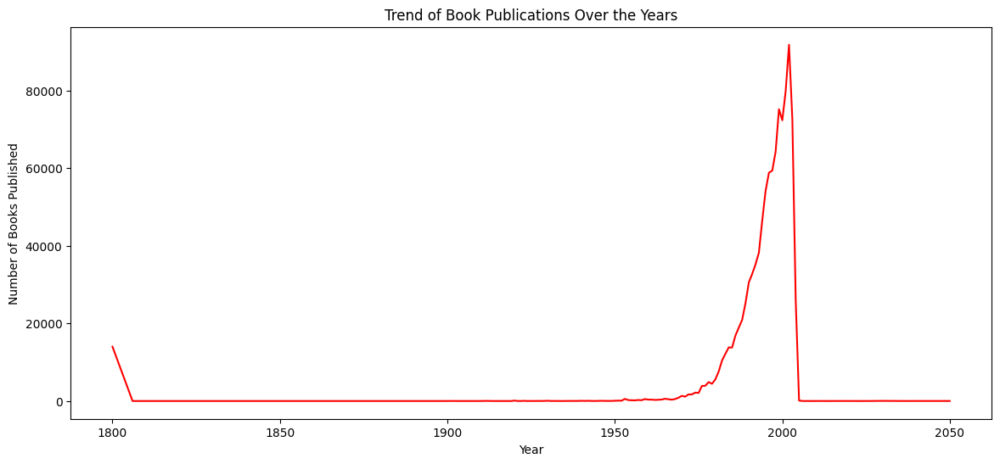

In [ ]:
plt.figure(figsize=(14, 6))
books_per_year.plot(kind='line', color='red')
plt.title("Trend of Book Publications Over the Years")
plt.xlabel("Year")
plt.ylabel("Number of Books Published")
plt.show()

In [ ]:
temp=data.drop(['Book-Title'],axis=1)
temp.corr()

,User-ID,Book-Rating,Year-Of-Publication,Age
User-ID,1.000000,-0.043983,0.001693,0.000127
Book-Rating,-0.043983,1.000000,0.003183,-0.019080
Year-Of-Publication,0.001693,0.003183,1.000000,0.006168
Age,0.000127,-0.019080,0.006168,1.000000


### Heatmap

<Axes: >

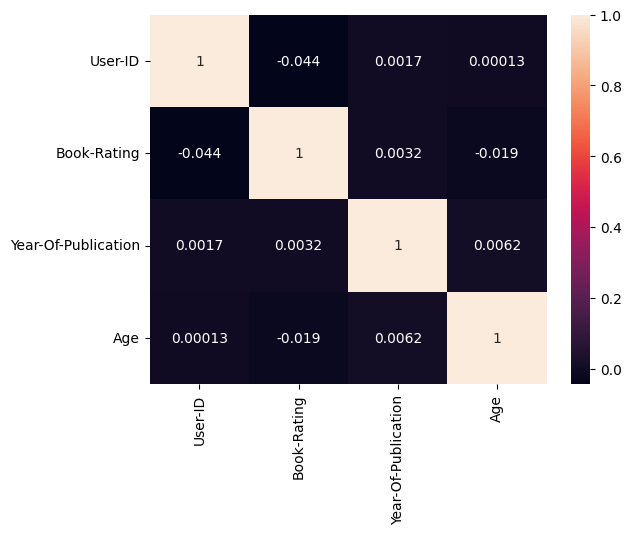

In [ ]:
sns.heatmap(temp.corr(),annot=True)

In [ ]:
data.head()

,User-ID,Book-Rating,Book-Title,Year-Of-Publication,Age
0,276725,0,Flesh Tones: A Novel,2002,35.0
1,276726,5,Rites of Passage,2001,35.0
2,276727,0,The Notebook,1996,28.0
3,276729,3,Help!: Level 1,1999,28.0
4,276729,6,The Amsterdam Connection : Level 4 (Cambridge ...,2001,28.0


In [ ]:
data["Book-Rating"].value_counts()

,count
Book-Rating,
0,647021
8,91787
10,71176
7,66393
9,60764
5,45334
6,31685
4,7617
3,5118


In [ ]:
filtered_data = data[data["Book-Rating"] > 0]

In [ ]:
# Define thresholds for filtering
min_user_interactions = 6  # Minimum number of ratings a user must have
min_book_interactions = 20  # Minimum number of ratings a book must have

# Filter users with fewer than min_user_interactions
user_counts = data['User-ID'].value_counts()
filtered_users = user_counts[user_counts >= min_user_interactions].index
filtered_data = data[data['User-ID'].isin(filtered_users)]

# Filter books with fewer than min_book_interactions
book_counts = filtered_data['Book-Title'].value_counts()
filtered_books = book_counts[book_counts >= min_book_interactions].index
filtered_data = filtered_data[filtered_data['Book-Title'].isin(filtered_books)]

In [ ]:

interaction_matrix = filtered_data.pivot_table(index="User-ID", columns="Book-Title", values="Book-Rating")


print(f"Filtered data has {filtered_data['User-ID'].nunique()} users and {filtered_data['Book-Title'].nunique()} books.")

Filtered data has 16673 users and 6660 books.


In [ ]:
interaction_matrix.head()

Book-Title,'Salem's Lot,10 Lb. Penalty,1001 Ways to Be Romantic,101 Dalmatians,"14,000 Things to Be Happy About",16 Lighthouse Road,1984,1st to Die: A Novel,2001: A Space Odyssey,2010: Odyssey Two,203 Ways to Drive a Man Wild in Bed,204 Rosewood Lane,2061: Odyssey Three,22 Indigo Place,24 Hours,253,2nd Chance,3001: The Final Odyssey,311 Pelican Court,3rd Degree,4 Blondes,50 Simple Things You Can Do to Save the Earth,52 Deck Series: 52 Ways to Celebrate Friendship,7b,8 Weeks to Optimum Health,8.4,84 Charing Cross Road,9-11,A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper)),A 3rd Serving of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper)),A 4th Course of Chicken Soup for the Soul: 101 More Stories to Open the Heart and Rekindle the Spirit,A 5th Portion of Chicken Soup for the Soul : 101 Stories to Open the Heart and Rekindle the Spirit,A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash,A Bend in the Road,A Body to Die For,A Book Without Covers,A Breach of Promise (William Monk Novels (Paperback)),A Brief History of Time : From the Big Bang to Black Holes,A Brief History of Time : The Updated and Expanded Tenth Anniversary Edition,A Calculated Risk,A Canticle for Leibowitz (Bantam Spectra Book),A Caress of Twilight (Meredith Gentry Novels (Hardcover)),A Caress of Twilight (Meredith Gentry Novels (Paperback)),A Case of Need,A Certain Justice (Adam Dalgliesh Mysteries (Hardcover)),A Certain Justice (Adam Dalgliesh Mysteries (Paperback)),A Certain Justice: A Novel,"A Child Called \It\"": One Child's Courage to Survive""",A Civil Action,"A Clash of Kings (A Song of Fire and Ice, Book 2)",A Clockwork Orange (Norton Paperback Fiction),A Cold Heart (Alex Delaware Novels (Paperback)),A Cold Heart: An Alex Delaware Novel,A Common Life : The Wedding Story (The Mitford Years),A Confederacy of Dunces,A Confederacy of Dunces (Evergreen Book),A Connecticut Yankee in King Arthur's Court (Bantam Classic),A Conspiracy of Paper : A Novel (Ballantine Reader's Circle),A Cook's Tour : Global Adventures in Extreme Cuisines,"A Crown of Swords (The Wheel of Time, Book 7)",A Cry In The Night,A Cup of Tea (Ballantine Reader's Circle),A Dangerous Fortune,A Darker Place,A Darkness More Than Night,A Darkness at Sethanon : Volume IV in the Riftwar Saga,A Day Late and a Dollar Short,A Day No Pigs Would Die,A Density of Souls,A Dog's Life,A Doll's House,A Drink Before the War (Patrick Kenzie/Angela Gennaro Novels),A Dry Spell,A Faint Cold Fear,A False Sense of Well Being (Ballantine Reader's Circle),A Farewell to Arms (A Scribner Classic),"A Fever in the Heart : Ann Rule's Crime Files, Volume III",A Fine Balance,A Fire Upon The Deep (Zones of Thought),A Friend of the Earth,"A Game of Thrones (A Song of Ice and Fire, Book 1)",A Gentle Feuding,A Gesture Life,A Gift To Last,A Gift of Love,A Girl Named Zippy: Growing Up Small in Mooreland Indiana (Today Show Book Club #3),A Girl's Best Friend,A Girl's Guide to Vampires,A God in Ruins,A Good House,A Gracious Plenty,A Grave Talent,A Great Deliverance,A Greek God at the Ladies' Club (Avon Romance),A Heart So Wild,A Heart Speaks,A Heart of Stone,A Heartbreaking Work Of Staggering Genius : A Memoir Based on a True Story,A Heartbreaking Work of Staggering Genius,A History of the World in 10 1/2 Chapters (Vintage International),A Holiday Of Love,A Is for Alibi (Kinsey Millhone Mysteries (Paperback)),A Kingdom of Dreams,A Kiss Remembered,A Kiss of Shadows (Meredith Gentry Novels (Hardcover)),A Kiss of Shadows (Meredith Gentry Novels (Paperback)),A Kiss to Remember,A Knight in Shining Armor,"A Knight of the Word (The Word and the Void Trilogy, Book 2)","A LITTLE YELLOW DOG : Featuring an Original Easy Rawlins Short Story \Gray-Eyed Death\"" (Easy Rawlins Mysteries (Paperback))""",A Lesson Before Dying (Vintage Contemporaries (Paperback)),A Lesson Before Dying (Vintage Contemporaries),A Letter of Mary (Mary Russell Novels (Paperback)),A Light 

In [ ]:
interaction_matrix.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16673 entries, 8 to 278854
Columns: 6660 entries, 'Salem's Lot to stardust
dtypes: float64(6660)
memory usage: 847.3 MB


In [ ]:
interaction_matrix.shape

(16673, 6660)

In [ ]:
interaction_matrix.count().sum()

361982

In [ ]:
filled=interaction_matrix.count().sum()/(28500*17482)

In [ ]:
sparsity=1-filled
sparsity*100

99.9273474270277

In [ ]:
user_item_matrix=interaction_matrix.fillna(0)
user_item_matrix.head()

Book-Title,'Salem's Lot,10 Lb. Penalty,1001 Ways to Be Romantic,101 Dalmatians,"14,000 Things to Be Happy About",16 Lighthouse Road,1984,1st to Die: A Novel,2001: A Space Odyssey,2010: Odyssey Two,203 Ways to Drive a Man Wild in Bed,204 Rosewood Lane,2061: Odyssey Three,22 Indigo Place,24 Hours,253,2nd Chance,3001: The Final Odyssey,311 Pelican Court,3rd Degree,4 Blondes,50 Simple Things You Can Do to Save the Earth,52 Deck Series: 52 Ways to Celebrate Friendship,7b,8 Weeks to Optimum Health,8.4,84 Charing Cross Road,9-11,A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper)),A 3rd Serving of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper)),A 4th Course of Chicken Soup for the Soul: 101 More Stories to Open the Heart and Rekindle the Spirit,A 5th Portion of Chicken Soup for the Soul : 101 Stories to Open the Heart and Rekindle the Spirit,A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash,A Bend in the Road,A Body to Die For,A Book Without Covers,A Breach of Promise (William Monk Novels (Paperback)),A Brief History of Time : From the Big Bang to Black Holes,A Brief History of Time : The Updated and Expanded Tenth Anniversary Edition,A Calculated Risk,A Canticle for Leibowitz (Bantam Spectra Book),A Caress of Twilight (Meredith Gentry Novels (Hardcover)),A Caress of Twilight (Meredith Gentry Novels (Paperback)),A Case of Need,A Certain Justice (Adam Dalgliesh Mysteries (Hardcover)),A Certain Justice (Adam Dalgliesh Mysteries (Paperback)),A Certain Justice: A Novel,"A Child Called \It\"": One Child's Courage to Survive""",A Civil Action,"A Clash of Kings (A Song of Fire and Ice, Book 2)",A Clockwork Orange (Norton Paperback Fiction),A Cold Heart (Alex Delaware Novels (Paperback)),A Cold Heart: An Alex Delaware Novel,A Common Life : The Wedding Story (The Mitford Years),A Confederacy of Dunces,A Confederacy of Dunces (Evergreen Book),A Connecticut Yankee in King Arthur's Court (Bantam Classic),A Conspiracy of Paper : A Novel (Ballantine Reader's Circle),A Cook's Tour : Global Adventures in Extreme Cuisines,"A Crown of Swords (The Wheel of Time, Book 7)",A Cry In The Night,A Cup of Tea (Ballantine Reader's Circle),A Dangerous Fortune,A Darker Place,A Darkness More Than Night,A Darkness at Sethanon : Volume IV in the Riftwar Saga,A Day Late and a Dollar Short,A Day No Pigs Would Die,A Density of Souls,A Dog's Life,A Doll's House,A Drink Before the War (Patrick Kenzie/Angela Gennaro Novels),A Dry Spell,A Faint Cold Fear,A False Sense of Well Being (Ballantine Reader's Circle),A Farewell to Arms (A Scribner Classic),"A Fever in the Heart : Ann Rule's Crime Files, Volume III",A Fine Balance,A Fire Upon The Deep (Zones of Thought),A Friend of the Earth,"A Game of Thrones (A Song of Ice and Fire, Book 1)",A Gentle Feuding,A Gesture Life,A Gift To Last,A Gift of Love,A Girl Named Zippy: Growing Up Small in Mooreland Indiana (Today Show Book Club #3),A Girl's Best Friend,A Girl's Guide to Vampires,A God in Ruins,A Good House,A Gracious Plenty,A Grave Talent,A Great Deliverance,A Greek God at the Ladies' Club (Avon Romance),A Heart So Wild,A Heart Speaks,A Heart of Stone,A Heartbreaking Work Of Staggering Genius : A Memoir Based on a True Story,A Heartbreaking Work of Staggering Genius,A History of the World in 10 1/2 Chapters (Vintage International),A Holiday Of Love,A Is for Alibi (Kinsey Millhone Mysteries (Paperback)),A Kingdom of Dreams,A Kiss Remembered,A Kiss of Shadows (Meredith Gentry Novels (Hardcover)),A Kiss of Shadows (Meredith Gentry Novels (Paperback)),A Kiss to Remember,A Knight in Shining Armor,"A Knight of the Word (The Word and the Void Trilogy, Book 2)","A LITTLE YELLOW DOG : Featuring an Original Easy Rawlins Short Story \Gray-Eyed Death\"" (Easy Rawlins Mysteries (Paperback))""",A Lesson Before Dying (Vintage Contemporaries (Paperback)),A Lesson Before Dying (Vintage Contemporaries),A Letter of Mary (Mary Russell Novels (Paperback)),A Light 

In [ ]:
user_similarity=cosine_similarity(user_item_matrix)

In [ ]:
user_similarity_df=pd.DataFrame(user_similarity,index=user_item_matrix.index,columns=user_item_matrix.index)

In [ ]:
user_similarity_df.head()

User-ID,8,17,53,99,114,183,242,243,244,254,272,300,383,384,387,388,408,424,444,446,476,486,487,503,505,507,566,567,595,619,626,638,643,651,709,712,714,728,735,741,746,753,776,805,819,834,843,853,876,882,899,900,901,929,989,1025,1063,1075,1083,1113,1116,1129,1131,1133,1155,1161,1167,1178,1184,1192,1211,1248,1254,1297,1343,1409,1412,1424,1435,1436,1467,1485,1548,1558,1585,1596,1608,1652,1660,1674,1688,1706,1725,1733,1790,1805,1812,1838,1848,1903,1928,2009,2010,2012,2030,2033,2041,2046,2090,2103,2110,2132,2134,2136,2139,2179,2189,2197,2276,2281,2287,2288,2313,2326,2333,2337,2349,2358,2363,2375,2399,2411,2437,2439,2442,2462,2559,2589,2630,2719,2738,2760,2766,2790,2793,2799,2853,2855,2891,2907,2954,2977,2996,3017,3066,3088,3100,3106,3142,3145,3154,3167,3192,3266,3282,3326,3329,3331,3346,3350,3363,3368,3371,3373,3374,3416,3418,3427,3437,3462,3471,3481,3508,3537,3538,3542,3556,3569,3578,3594,3640,3643,3669,3675,3693,3719,3728,3743,3757,3761,3775,3814,3817,3827,3840,3856,3881,3915,3917,3923,3954,3965,3977,4017,4049,4066,4090,4091,4092,4098,4114,4131,4138,4144,4149,4157,4164,4179,4197,4221,4223,4228,4285,4334,4365,4370,4385,4401,4483,4547,4570,4571,4600,4622,4781,4785,4795,4802,4809,4816,4838,4845,4864,4895,4896,4938,5037,5048,5091,5127,5163,5207,5208,5209,5268,5285,5286,5287,5331,5350,5375,5385,5414,5416,5429,5439,5448,5452,5476,5483,5490,5499,5506,5539,5543,5555,5582,5585,5600,5609,5638,5639,5665,5669,5674,5694,5709,5722,5728,5730,5737,5741,5746,5769,5777,5790,5815,5834,5850,5899,5903,5920,5932,5942,5956,5963,5975,5988,5998,6007,6011,6051,6073,6092,6102,6115,6120,6229,6238,6242,6249,6251,6280,6318,6323,6330,6333,6338,6345,6347,6366,6368,6398,6401,6431,6432,6450,6460,6492,6497,6501,6505,6516,6532,6537,6543,6563,6564,6566,6575,6577,6582,6592,6604,6611,6642,6662,6671,6679,6689,6700,6731,6741,6769,6772,6781,6789,6840,6865,6866,6871,6884,6894,6900,6906,6958,6990,7033,7053,7056,7060,7072,7079,7082,7105,7107,7125,7128,7134,7158,7181,7210,7283,7286,7312,7318,7319,7326,7341,7346,7348,7352,7355,7371,7384,7418,7426,7454,7482,7509,7528,7547,7565,7569,7620,7630,7637,7651,7809,7841,7860,7864,7882,7886,7887,7890,7898,7908,7913,7915,7930,7954,7958,7962,7970,7980,8018,8019,8027,8034,8040,8065,8066,8067,8094,8095,8141,8167,8187,8188,8201,8234,8245,8250,8253,8255,8284,8290,8313,8314,8323,8344,8362,8419,8454,8487,8529,8568,8570,8584,8660,8672,8676,8680,8681,8687,8695,8734,8737,8739,8782,8801,8815,8839,8844,8864,8870,8872,8890,8935,8936,8937,8955,8961,8971,9029,9080,9094,9138,9139,9141,9143,9177,9183,9224,9226,9227,9289,9295,9313,9341,9354,9357,9373,9381,9408,9414,9417,9454,9504,9525,9568,9571,9574,9613,9660,9717,9718,9747,9806,9856,9867,9893,9908,9974,10001,10030,10067,10118,10199,10205,10241,10314,10315,10334,10338,10351,10354,10433,10447,10502,10532,10546,10560,10570,10571,10590,10607,10619,10660,10668,10681,10697,10699,10716,10813,10819,10829,10836,10863,10917,10924,10946,10949,10951,10959,10965,10985,11036,11037,11038,11070,11104,11120,11124,11179,11192,11198,11201,11206,11224,11231,11245,11260,11279,11285,11325,11362,11393,11399,11400,11435,11451,11456,11464,11517,11521,11529,11532,11601,11621,11629,11638,11657,11676,11687,11690,11708,11709,11718,11724,11766,11788,11797,11817,11832,11844,11855,11881,11916,11924,11944,11993,12035,12081,12091,12100,12111,12112,12123,12137,12143,12154,12158,12189,12194,12209,12220,12231,12238,12272,12278,12282,12316,12331,12343,12348,12362,12390,12392,12488,12512,12515,12537,12538,12569,12576,12614,12619,12657,12663,12671,12680,12685,12692,12698,12702,12707,12734,12754,12756,12784,12811,12824,12828,12835,12863,12917,12945,12951,12965,12982,12990,13026,13032,13057,13060,13080,13082,13093,13094,13104,13126,13141,13148,13164,13173,13215,13221,13223,13256,13268,13273,13279,13280,13331,13347,13393,13518,13540,13551,13552,13582,13600,13604,13607,13664,13666,13668,13682,13709,13715,13722,13733,13763,13850,13867,13872,13896,13915,13935,13968,13973,13995,14007,14014,14049,14079,14085,14087,14173,14180,14201,14230,14232,14249,1

In [ ]:
'''def predict_ratings(user_id, top_n=5):
    import numpy as np
    import pandas as pd

    # Get the user's ratings from the interaction matrix
    user_ratings = interaction_matrix.loc[user_id]

    # Identify movies/books that the user hasn't rated yet
    unrated_movies = user_ratings[user_ratings.isna()].index

    predicted_ratings = {}

    for movie in unrated_movies:
        # Get ratings for the movie/book from all users
        movie_ratings = interaction_matrix[movie]

        # Calculate the weighted average of ratings from similar users
        weighted_sum = np.dot(user_similarity_df.loc[user_id], movie_ratings.fillna(0))
        similarity_sum = np.sum(np.abs(user_similarity_df.loc[user_id]))

        # Avoid division by zero
        predicted_rating = weighted_sum / (similarity_sum if similarity_sum != 0 else 1)

        # Store the predicted rating only if it's greater than zero
        if predicted_rating > 0:
            predicted_ratings[movie] = predicted_rating

    # Convert the predicted ratings into a DataFrame and sort by predicted rating
    recommendations = pd.DataFrame(predicted_ratings.items(), columns=['Book_Title', 'predicted_rating'])
    recommendations = recommendations.sort_values(by='predicted_rating', ascending=False).head(top_n)

    return recommendations'''

"def predict_ratings(user_id, top_n=5):\n    import numpy as np\n    import pandas as pd\n\n    # Get the user's ratings from the interaction matrix\n    user_ratings = interaction_matrix.loc[user_id]\n\n    # Identify movies/books that the user hasn't rated yet\n    unrated_movies = user_ratings[user_ratings.isna()].index\n\n    predicted_ratings = {}\n\n    for movie in unrated_movies:\n        # Get ratings for the movie/book from all users\n        movie_ratings = interaction_matrix[movie]\n\n        # Calculate the weighted average of ratings from similar users\n        weighted_sum = np.dot(user_similarity_df.loc[user_id], movie_ratings.fillna(0))\n        similarity_sum = np.sum(np.abs(user_similarity_df.loc[user_id]))\n\n        # Avoid division by zero\n        predicted_rating = weighted_sum / (similarity_sum if similarity_sum != 0 else 1)\n\n        # Store the predicted rating only if it's greater than zero\n        if predicted_rating > 0:\n            predicted_ratings[mo

In [ ]:
'''user_id_example =114
recommendations_example = predict_ratings(user_id_example)
recommendations_example'''

'user_id_example =114\nrecommendations_example = predict_ratings(user_id_example)\nrecommendations_example'

# pickle files

In [ ]:
'''# Save the user similarity matrix
user_similarity_df.to_csv("user_similarity.csv")

# Save the user-item matrix
interaction_matrix_filled.to_csv("user_item_matrix.csv")'''


'# Save the user similarity matrix\nuser_similarity_df.to_csv("user_similarity.csv")\n\n# Save the user-item matrix\ninteraction_matrix_filled.to_csv("user_item_matrix.csv")'

In [ ]:
def recommend_items(user_id, user_similarity_df, user_item_matrix, top_n=5):
    # Get similarity scores for the given user
    similar_users = user_similarity_df[user_id].sort_values(ascending=False)

    # Find items rated by similar users that the current user hasn't rated
    user_ratings = user_item_matrix.loc[user_id]
    items_to_recommend = {}

    for other_user, similarity in similar_users.items():  # Use .items() instead of .iteritems()
        if other_user == user_id:
            continue  # Skip the current user

        other_user_ratings = user_item_matrix.loc[other_user]
        for item, rating in other_user_ratings.items():  # Use .items() for iteration
            if user_ratings[item] == 0 and rating > 0:  # User hasn't rated this item
                items_to_recommend[item] = items_to_recommend.get(item, 0) + similarity * rating

    # Sort recommended items by score
    recommended_items = sorted(items_to_recommend.items(), key=lambda x: x[1], reverse=True)[:top_n]

    return [item for item, _ in recommended_items]



In [ ]:
user_id = 114
recommended_items = recommend_items(user_id, user_similarity_df, user_item_matrix)
print(f"Recommended items for User {user_id}: {recommended_items}")

Recommended items for User 114: ['The Da Vinci Code', 'Digital Fortress : A Thriller', 'Deception Point', 'The Summons', 'The Lovely Bones: A Novel']
